# Monitoring The Progress of the COVID-19 Pandemic

## A Julia Data Analysis Tutorial
## By Daniel Lakeland
## Lakeland Applied Sciences LLC


As a mathematical modeler and data analyst many of my friends have
asked me questions about what is going on with the COVID pandemic. On
my blog I've posted some graphs as PDFs with updates every few weeks,
but it's more convenient to give my friends and family an executable
Jupyter notebook where they can update to the latest data any time
they want. Let's get started by grabbing the daily data for all states
from the [Covid Tracking Project](https://covidtracking.com/)

We'll use the
[Vegalite graphics library](https://vega.github.io/vega-lite/docs/)
this time with the
[@vlplot](https://www.queryverse.org/VegaLite.jl/stable/userguide/vlplotmacro/)
macro.

In [1]:
using Queryverse

usdata = "https://covidtracking.com/api/v1/states/daily.csv"

dat = DataFrame(load(usdata))

display(first(dat,5))

,date,state,positive,negative,pending,hospitalizedCurrently,hospitalizedCumulative,inIcuCurrently,inIcuCumulative,onVentilatorCurrently
,Int64,String,Int64⍰,Int64⍰,Int64⍰,Int64⍰,Int64⍰,Int64⍰,Int64⍰,Int64⍰
1,20200607,AK,544,64360,missing,7,missing,missing,missing,1
2,20200607,AL,20500,239066,missing,missing,2022,missing,615,missing
3,20200607,AR,9426,150847,missing,145,844,missing,missing,35
4,20200607,AS,0,174,missing,missing,missing,missing,missing,missing
5,20200607,AZ,26889,254732,missing,1252,3352,392,missing,248


# Understanding the Data

The Covid Tracking Project aggregates data from all the states on
various important measures. For the moment let's focus on daily
positive tests, the ratio of total tests to positive tests, the number
of hospitalized patients, and the number of deaths per day. 

Let's figure out which columns those correspond to:

In [2]:
println(names(dat))

using Dates

function convdate(d::Int)
    return(Date(div(d,10000),div(mod(d,10000),100),mod(d,100)));
end

dat2 = dat |> @mutate(thedate=convdate(_.date)) |> DataFrame

allstates = unique(dat.state);

[:date, :state, :positive, :negative, :pending, :hospitalizedCurrently, :hospitalizedCumulative, :inIcuCurrently, :inIcuCumulative, :onVentilatorCurrently, :onVentilatorCumulative, :recovered, :dataQualityGrade, :lastUpdateEt, :dateModified, :checkTimeEt, :death, :hospitalized, :dateChecked, :fips, :positiveIncrease, :negativeIncrease, :total, :totalTestResults, :totalTestResultsIncrease, :posNeg, :deathIncrease, :hospitalizedIncrease, :hash, :commercialScore, :negativeRegularScore, :negativeScore, :positiveScore, :score, :grade]


Let's create a function that plots percentage positive, positive per
day, and deaths per day for a given state...

In [3]:
function plotstate(df,state)
    dfstate = df |> @filter(_.state == state) |> 
        @mutate(testpct=_.positiveIncrease/(_.totalTestResultsIncrease+.1)) |>
        @select(:thedate,:state,:testpct,:positiveIncrease,:deathIncrease)|>DataFrame

    testing = @vlplot(width=300,layer=[],title="Testing in $state") +
        @vlplot(:point,x=:thedate,y={:testpct,axis={title="Percentage Positive"}}) + 
        @vlplot(transform=[{loess=:testpct,on=:thedate}],mark=:line,x=:thedate,y=:testpct)

    cases = @vlplot(width=300,layer=[],title="Cases in $state") + 
        @vlplot(mark={:point,filled=true},
                x=:thedate,y={:positiveIncrease,axis={title="Cases Per Day"}})+
    @vlplot(transform=[{loess=:positiveIncrease,on=:thedate,bandwidth=.2}],
            mark=:line,x=:thedate,y=:positiveIncrease)
    
    deaths = @vlplot(width=300,layer=[],title="Deaths in $state") + 
        @vlplot(:point,x=:thedate,y=:deathIncrease) + 
        @vlplot(transform=[{loess=:deathIncrease,on=:thedate,bandwidth=.2}],
                mark=:line,x=:thedate,y={:deathIncrease,axis={title="Deaths Per Day"}})
    
    return(dfstate |> hcat(testing,cases,deaths))
    
end

#test output
#plotstate(dat2,"CA")

plotstate (generic function with 1 method)

# Plotting All The States:

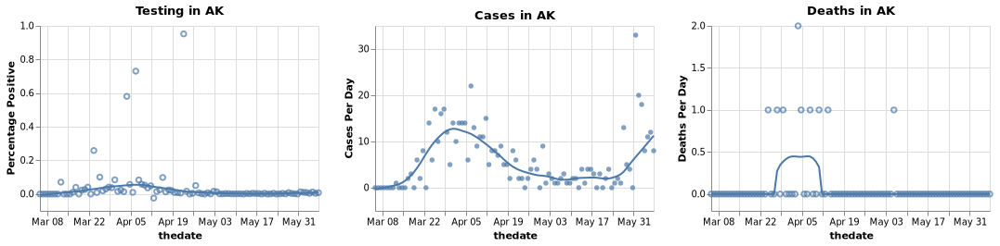

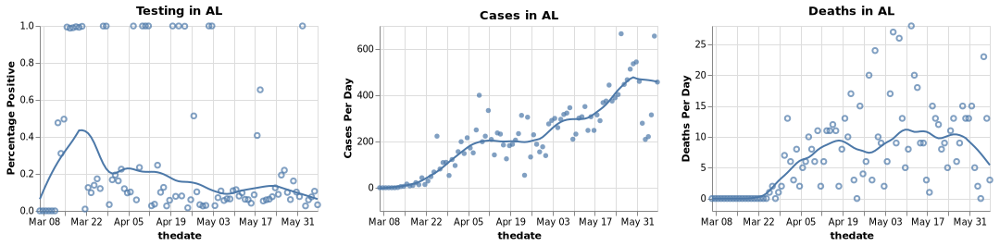

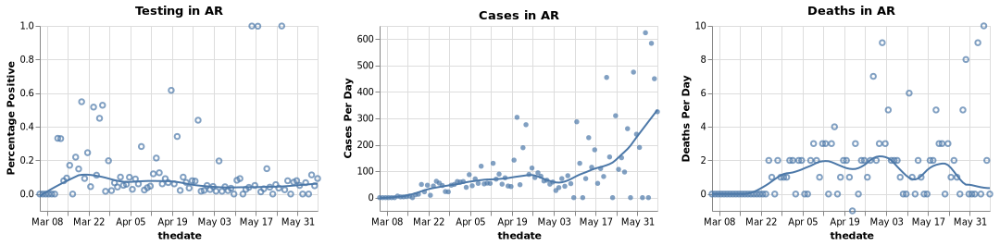

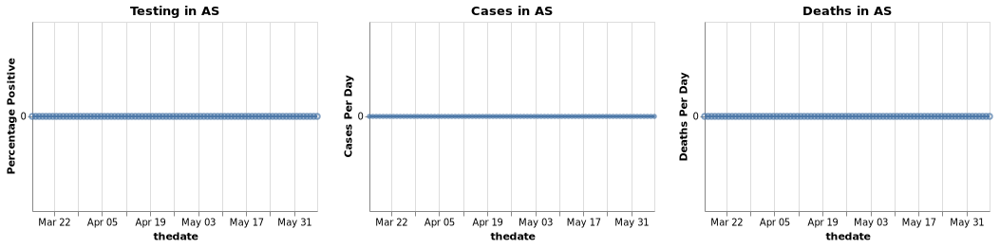

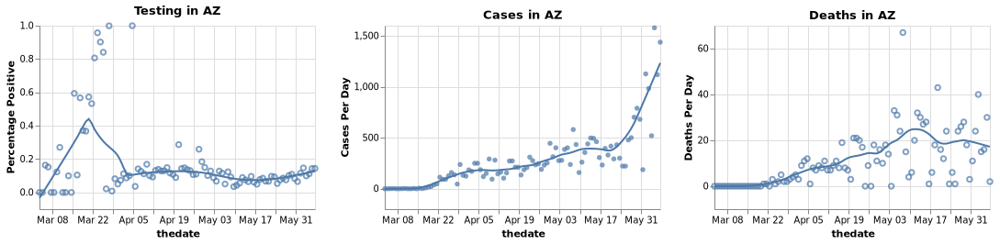

...

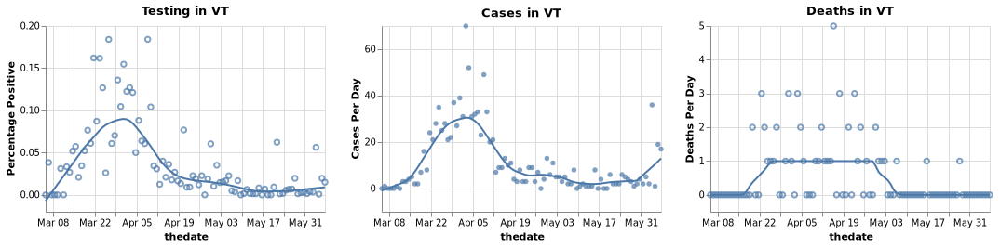

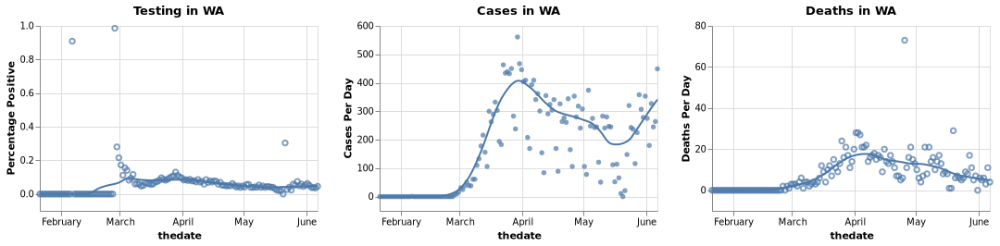

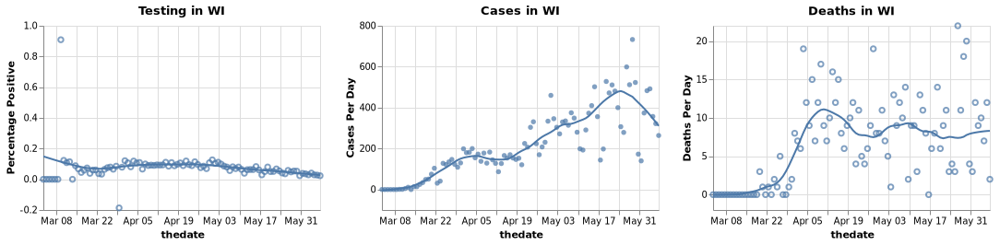

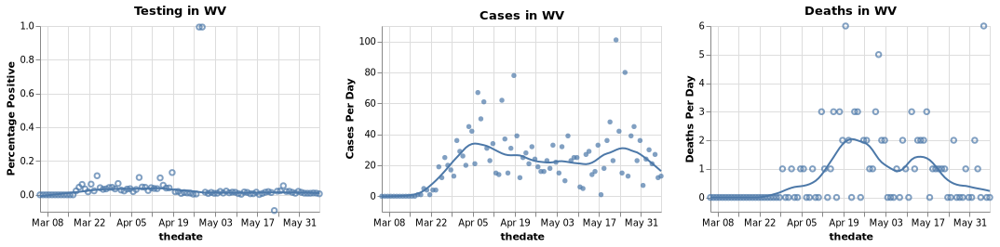

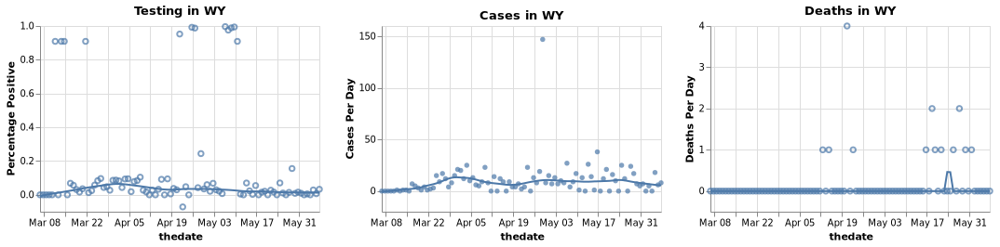

In [4]:
for i in allstates
    display(plotstate(dat2,i))
end